# Tarea semanal 13
## Martín Deleón

### Consignas:

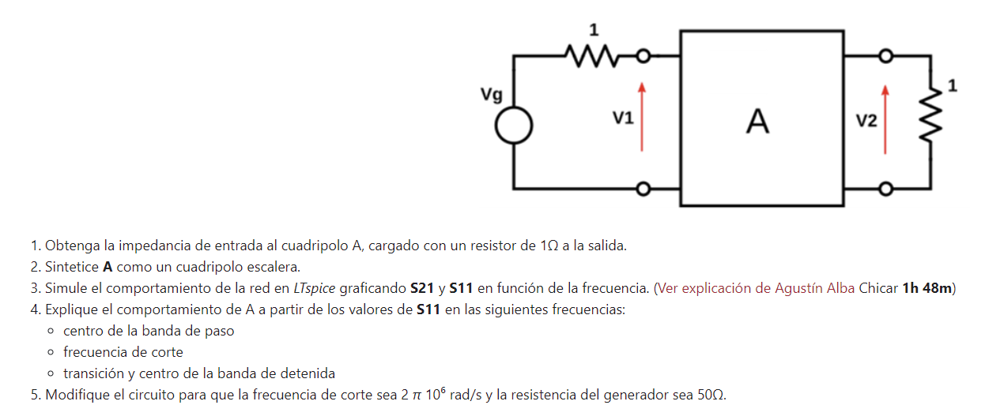

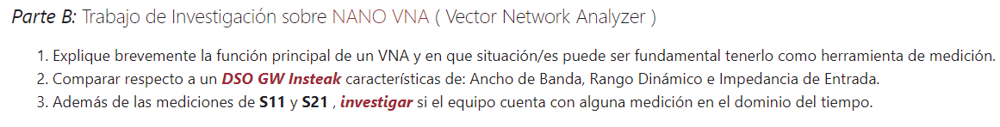

### Parte A
Esta sección del trabajo se basa en el diseño y la síntesis de una función transferencia doblemente cargada. El ejercicio pide sintetizar un circuito que cumpla con una transferencia Bessel pasabajo de 3er orden.

#### Análisis en papel

In [1]:
from IPython.display import IFrame
IFrame("TS 13.pdf", width=1000, height=800)

#### Análisis númerico
En esta sección realizaremos el análisis númerico de la sintesis.


In [1]:
from pytc2.sintesis_dipolo import remover_polo_dc, remover_polo_infinito
from pytc2.general import print_latex, print_subtitle, a_equal_b_latex_s
from pytc2.remociones import remover_polo_jw, remover_valor_en_infinito, remover_valor_en_dc, remover_polo_sigma
from pytc2.remociones import modsq2mod_s
import sympy as sp

In [3]:

s = sp.symbols('s', complex=True)

S21 = sp.Rational('15')/(s**3 + sp.Rational('6')*s**2 + sp.Rational('15')*s + sp.Rational('15') )

print_latex(a_equal_b_latex_s('S21(s)', S21))

S11sq = sp.factor( 1- (S21 * S21.subs(s, -s)) )
S11sq = sp.simplify(S11sq)
print_latex(a_equal_b_latex_s('S11sq(s)', S11sq))

S11 = modsq2mod_s(S11sq)
print_latex(a_equal_b_latex_s('S11(s)', S11))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

En este punto podemos ver que se obtienen los mismos valores. Cabe destacar que en el papel se utilizaron letras para no tener que estar escribiendo tantos decimales, pero si reemplaza en la calculadora se obtiene lo mismo.

In [4]:

Z1 = sp.simplify(sp.expand(sp.simplify(sp.expand(1+S11))/sp.simplify(sp.expand((1-S11)))))

Z1 = sp.nsimplify(Z1)
print_latex(a_equal_b_latex_s('Z1(s)', Z1))

<IPython.core.display.Math object>

In [5]:
# Realizamos la remoción parcial en infinito de z1
Z3, L1 = remover_polo_infinito(Z1)

# Realizamos la remoción parcial en infinito de y3
Y5, C1 = remover_polo_infinito(1/Z3)

# Realizamos la remoción parcial en infinito de z5
Z7, L2 = remover_polo_infinito(1/Y5)

print_latex(a_equal_b_latex_s('L1(s)', L1))
print_latex(a_equal_b_latex_s('C1(s)', C1))
print_latex(a_equal_b_latex_s('L2(s)', L2))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

En este punto se podría pedirle a python que nos dibuje el circuito pero en este punto encontré que el NBviewer no es capaz de representar esto. Por esta razón decidi no hacer este tipo de simulación.

#### Análisis circuital
Para verificar los parámetros pedidos, se simulará en Spice el circuito y se graficaran los parámetros S11 y S21.

Circuito a simular:

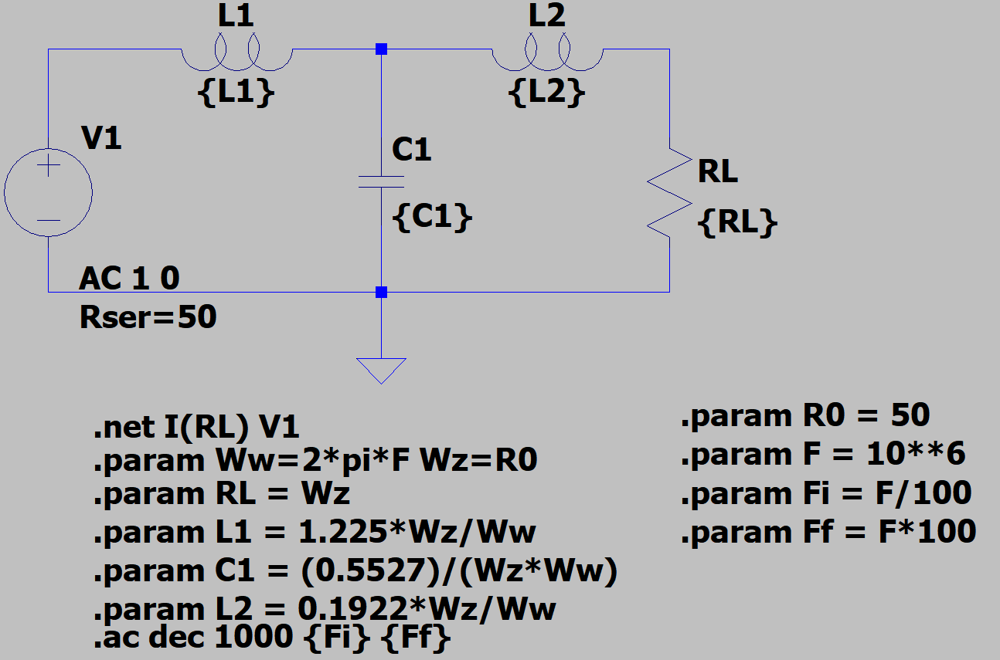

En este punto me di cuenta que no había guardado, por lo que el circuito a simular no es exactamente este. Este corresponde a la desnormalización. Pero lo que se agregó fue la norma de frecuencia. Los valores de los comoponentes corresponden con el circuito NORMALIZADO.

En la siguiente imágen podemos ver con poco detalle los parámetros S11 y S21.

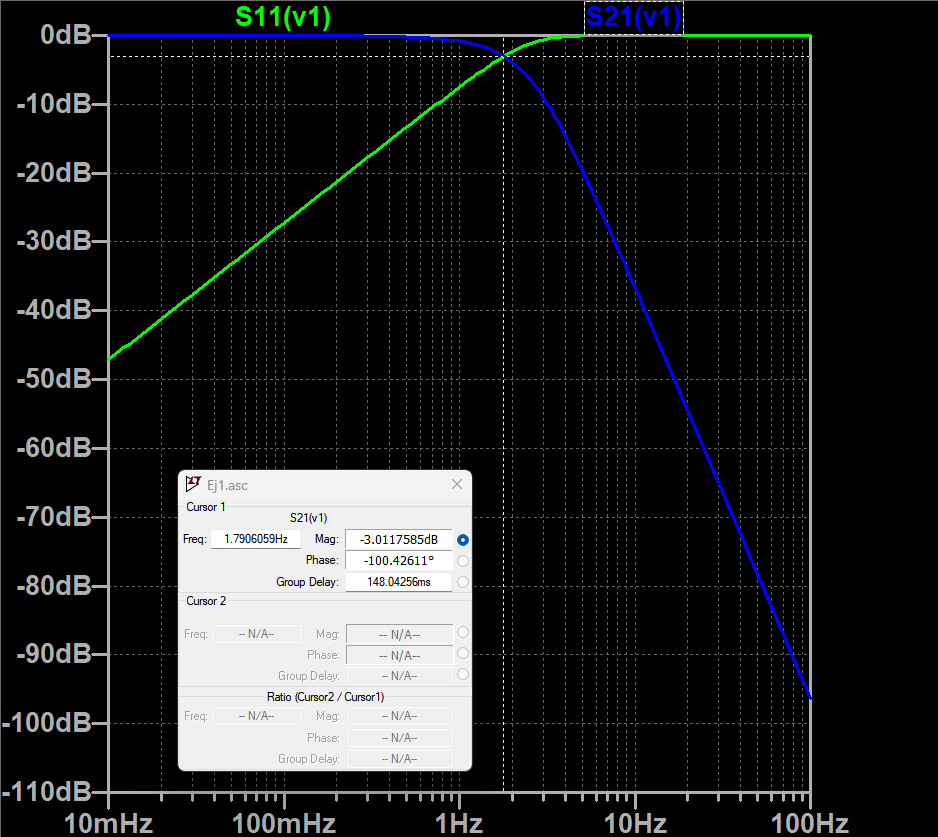

En la siguiente imágen vemos con más detalle la banda de paso.

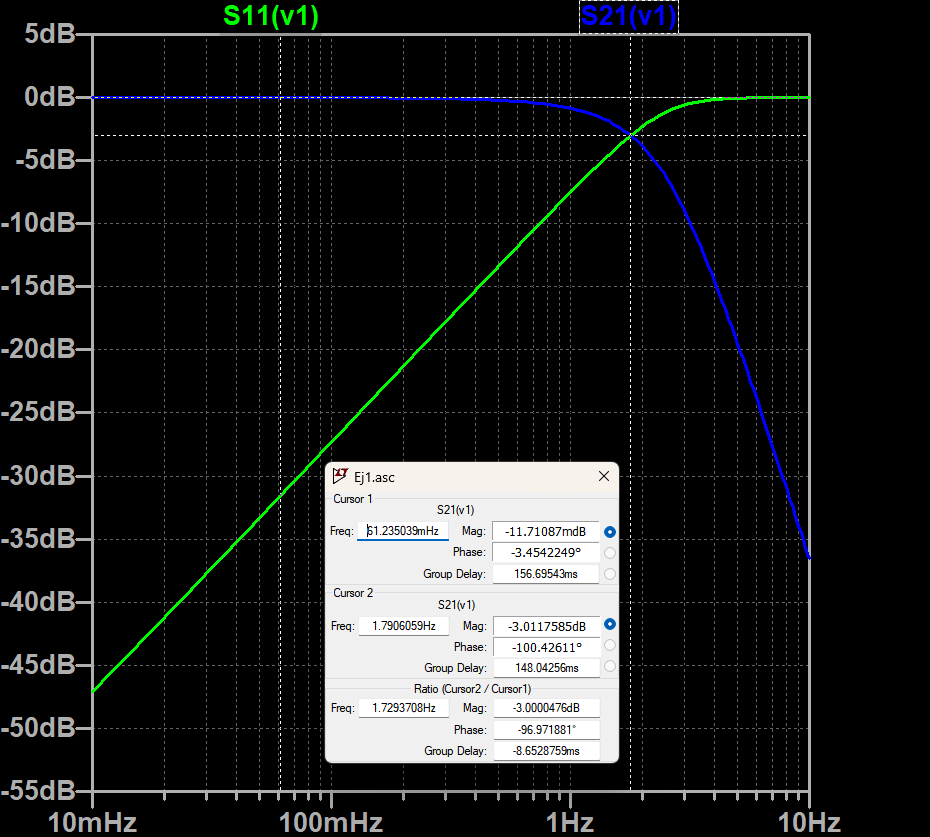

En la siguiente imágen vemos con más detalle la banda detenida.

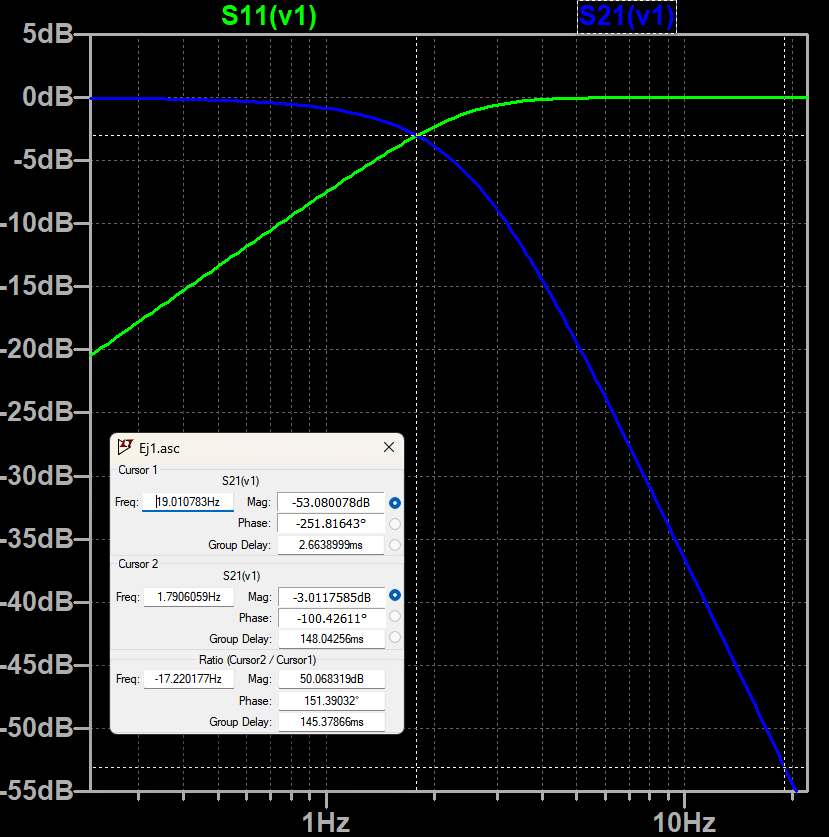

De la misma forma podemos ver la fase de estos parámetros:

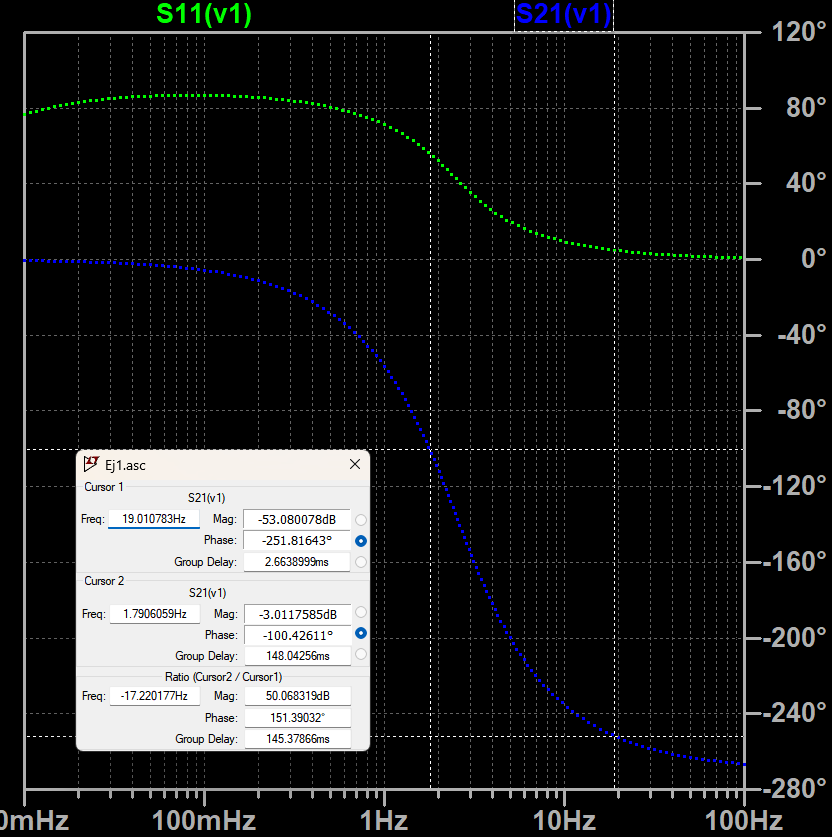

Por último vemos el retardo de grupo:

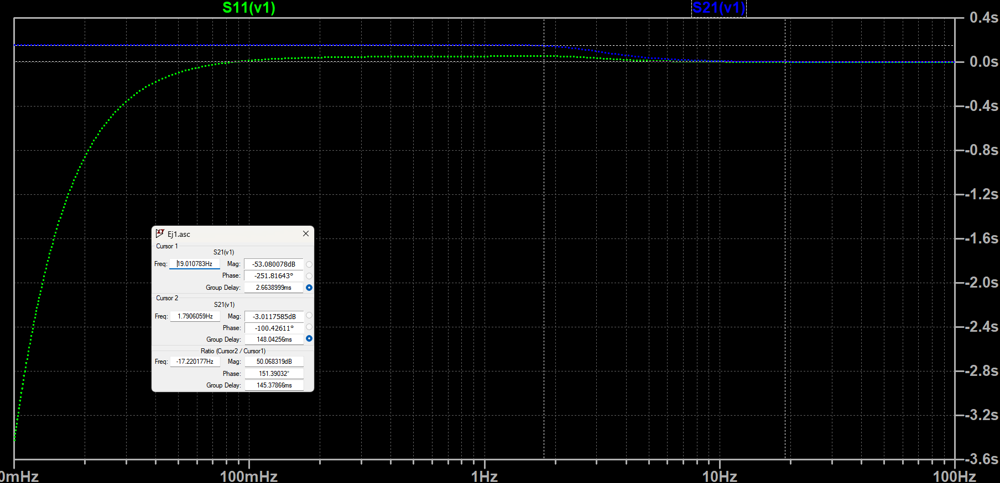

##### Detalle de los parámetros

El parámetro S11 es el parámetro que compara la onda de tensión incidente con la reflejada en el puerto 1.
En el centro de la banda de paso, es decir, en bajas frecuencias para este circuito. El parámetro S11 es muy pequeño, tendiendo a anularse, esto nos indica que toda la potencia inyectada se transmite a la carga y en muy poca potencia se ve reglejada al generador.
En la banda de transición y principalmente en la frecuencia de corte el S11 tiene el mismo valor que el S21, lo cual se vio en la teoría para redes no disipativas. Esto nos indica que la mitad de la potencia se transmite a la carga y la otra mitad se refleja al generador.
En la banda detenida, en este caso para altas frecuencias el S11 tiende a 0dB, esto es un claro indicio de que en alta frecuencia no hay transmición de potencia a la carga, toda la potencia se refleja al generador.

##### Desnormalización
Para este punto se pide desnormalizar la transferencia, para esto aplicamos el conocimiento de la primer parte del año.

El circuito utilizado es el siguente
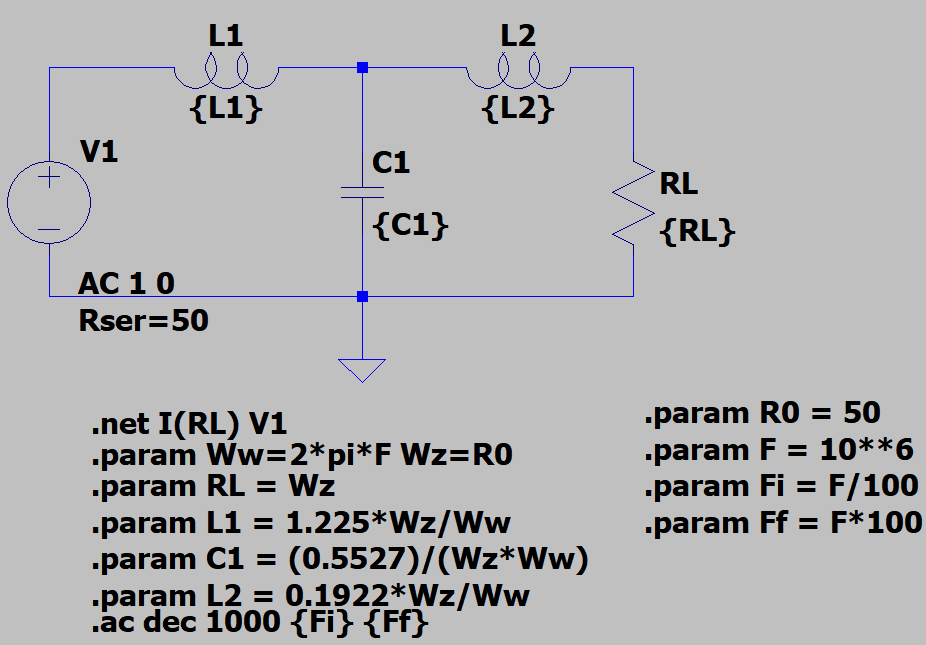

Resultado de simulación:

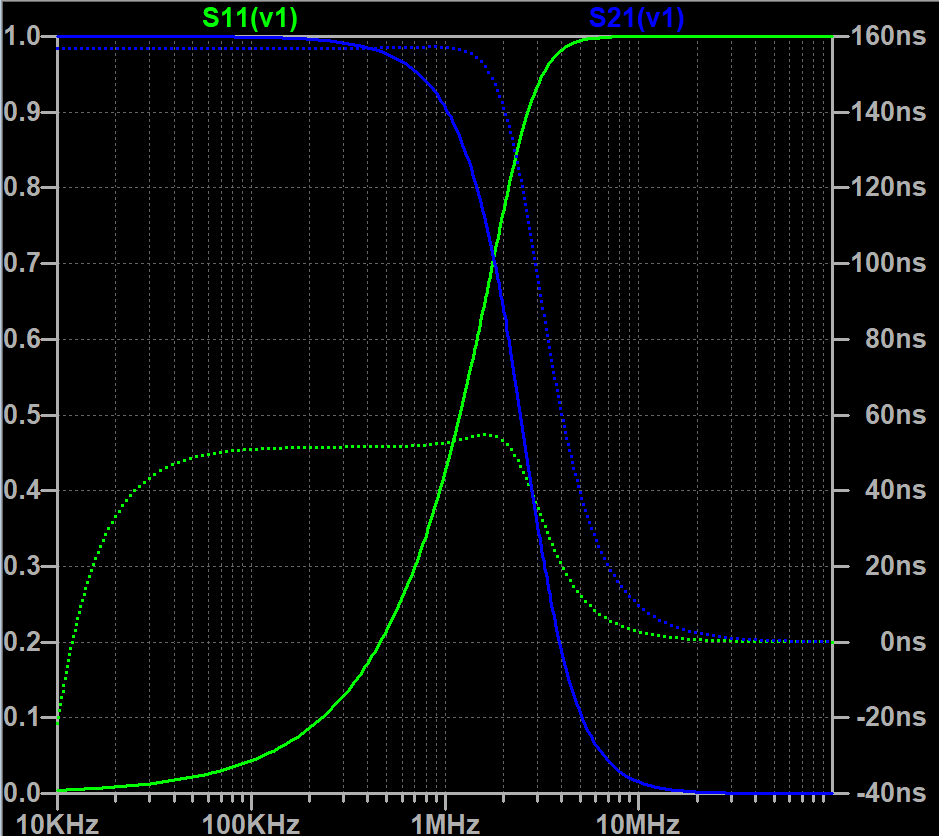

### Parte B

En esta semana no pude dedicarle tiempo a la materia, por lo que decidi realizar la investigación sobre el VNA.

#### Introducción

Un Analilazor vectorial de redes o más comúnmente llamado VNA por sus siglas en inglés es una herramienta fundamental de medición para el análisis y diseño de sistemas que utilizan radiofrecuencia o RF, aunque estas aplicaciones no son las únicas, sino que cuando se utiliza microondas y altas frecuencias este dispositivo puede ser de gran utilidad.

En la siguiente imágen podemos ver un NANO VNA como el que se utilizará en la materia.

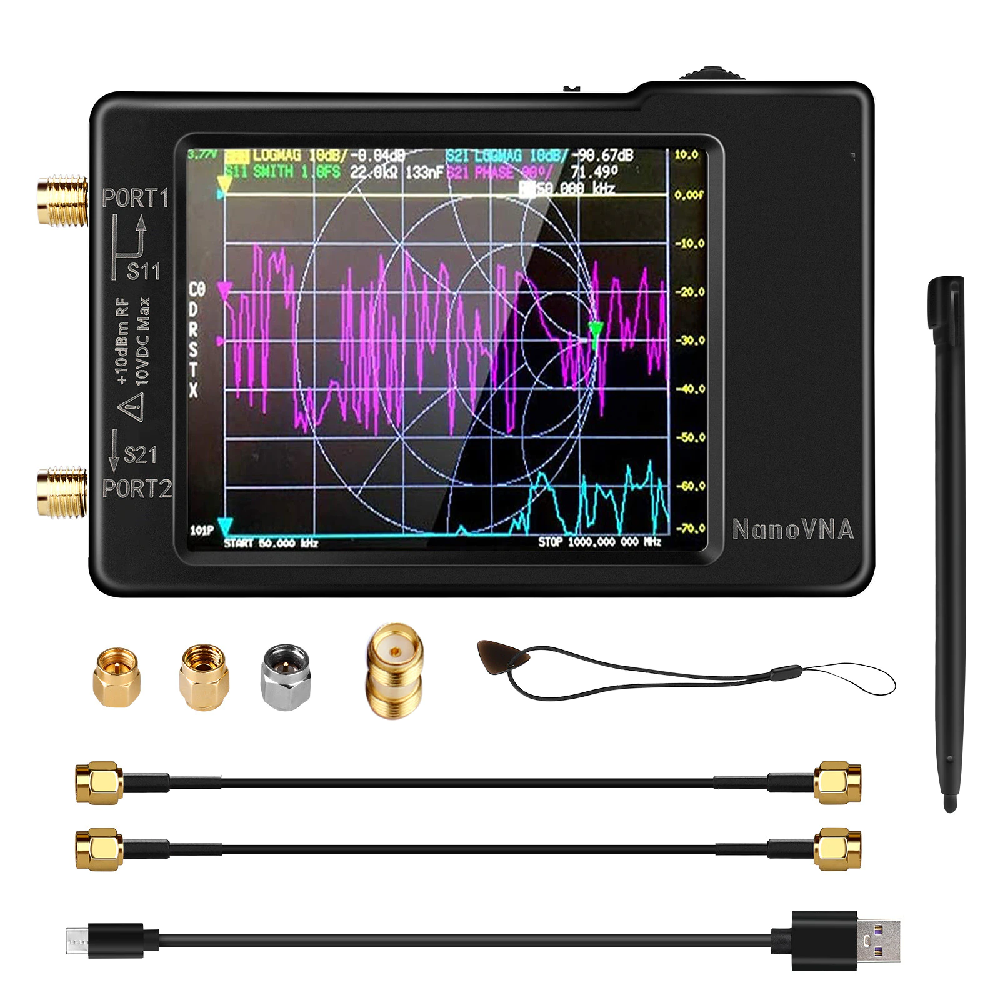


#### Funciones principales

1. Medición de parámetros S o parámetros scatering.
    Este dispositivo nos permite caracterizar redes por sus parámetros S, estos describen cómo una señal se refleja o se transmite por un dispositivo ya sea un filtro, una guía de onda o cualquier otro dispositivo en función de la frecuencia.
    Este tipo de párametros son esenciales para saber como se comportará un dispositivo al ser conectado a un sistema, especialmente en términos de adaptación de impoeddancias.

2. Análisis de fase.
    Este instrumento tambien es capaz de caracterizar la fase del circuito lo cual es sumamente importante para el diseño o ajuste de las redes de transmisión por ejemplo.

3. ROE.
    Tambien es capaz de medir la relación de onda estacionaria o más comúnmente llamado ROE, el cual esta fuertemente relacionado con el nuvel de adaptación de impedancia entre un dispositivo y el sistema de transmisión.

#### Lugares donde debe estar

Dado que las reflexiones en terminos de ondas, son fenomenos que pueden considerearse como perdidas, por lo que en lugares donde la energía o potencia es limitada, queremos minimizar estas reflexiones. 

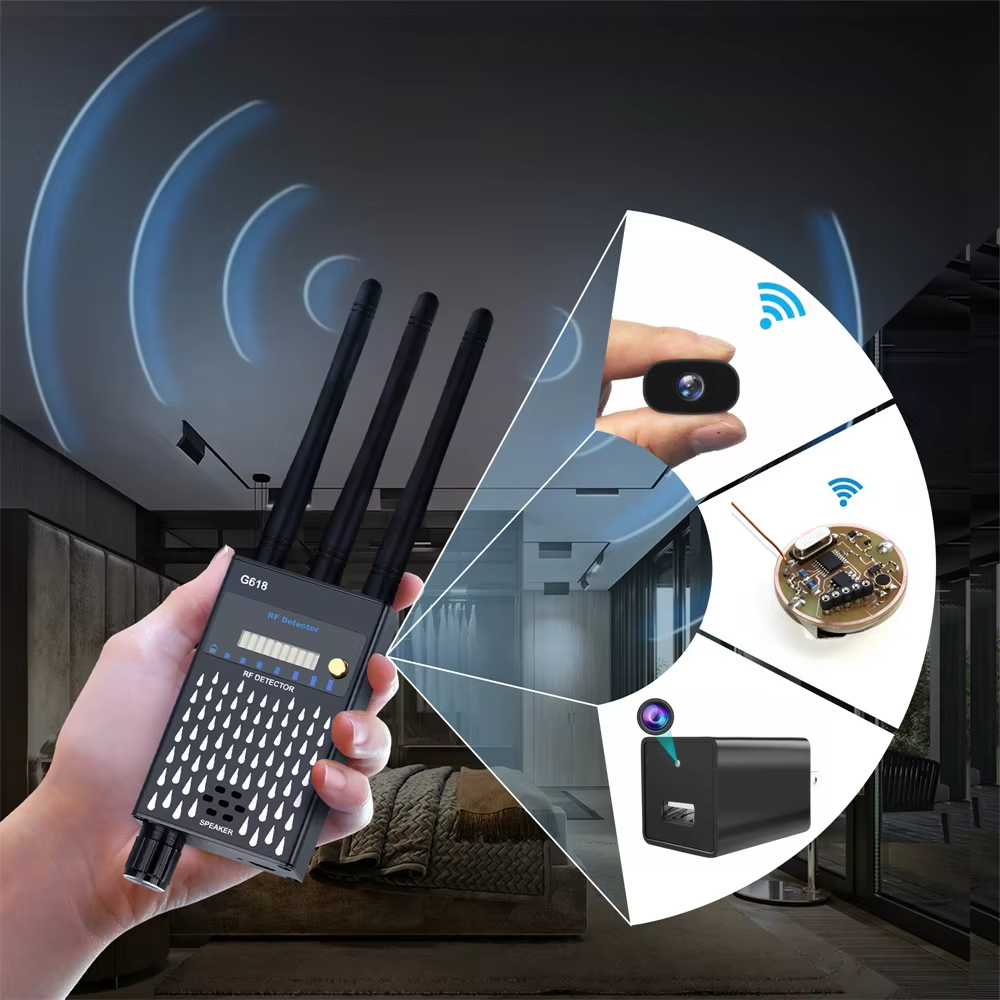

Para ello podemos utilizar el VNA, y medir el nivel de adaptación, dado que en un sistema que este perfectamente adaptado la reflexión deberia ser nula. 
Mencionado esto podemos concluir que los lugares en donde puede ser impresindible este instrumento es en el diseño y prueba de antenas, o calibraciones y caracterizaciones de filtros para radio frecuencia.
Tambien puede utilizarse para medir conectores y cables o para caracterizar la fase y ganancia de un amplificador.

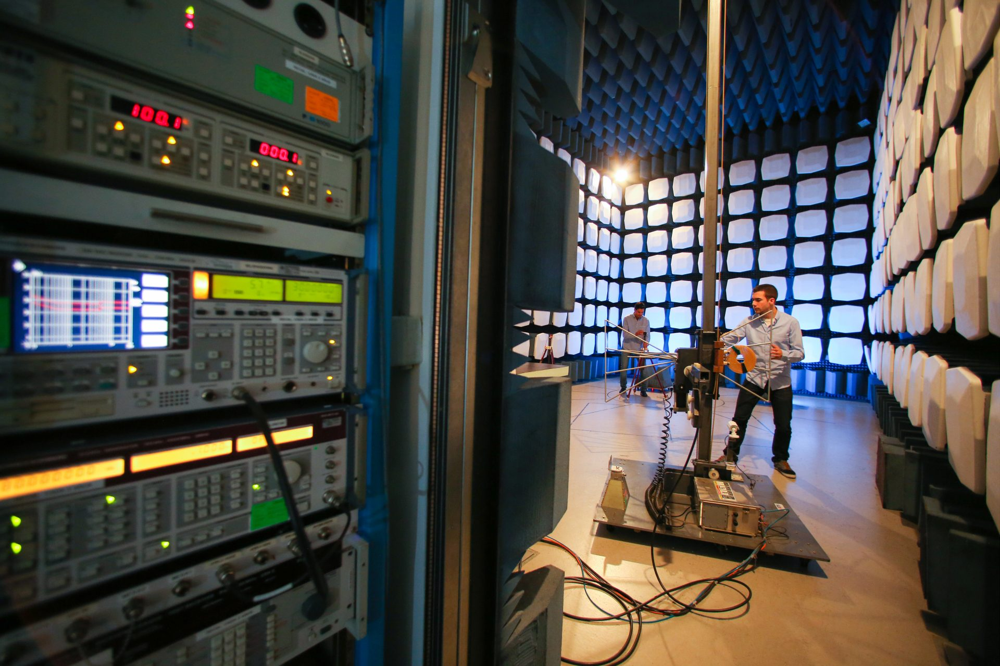


#### Conclusión de este primer inciso 

El uso de un VNA es imprecindible en aplicaciones donde se requiera un control muy preciso de la impedancia, las pérdidas por reflexión y las características de transmisión de un sistema RF. Esto lo convierte en una herramienta vital para los laboratorios de radiofrecuencia o telecomunicaciones.


#### Especificaciones

Dado que haremos uso de este mismo dispositivo, es necesario realizar una investigación sobre sus caracteristicas o especificaciones.

- Rango de frecuencias: 50 $kHz$ - 4.4 $GHz$
    - Resolición de frecuencia: 0.01 $MHz$

- Rango dinámico o slew rate: 90 $dB$

- Piso de ruido: -50 $dB$

- Puntos de barrido: 1-1024.
    En caso de utilizarlo conectado a la pc, podemos obtener hasta 65535 puntos.

    Cabe aclarar que algunos parámetros están especificado en ciertas condiciones, por lo que debajo de este resumen en donde se encuentran las mas importantes estará una imágen con dicha tabla.


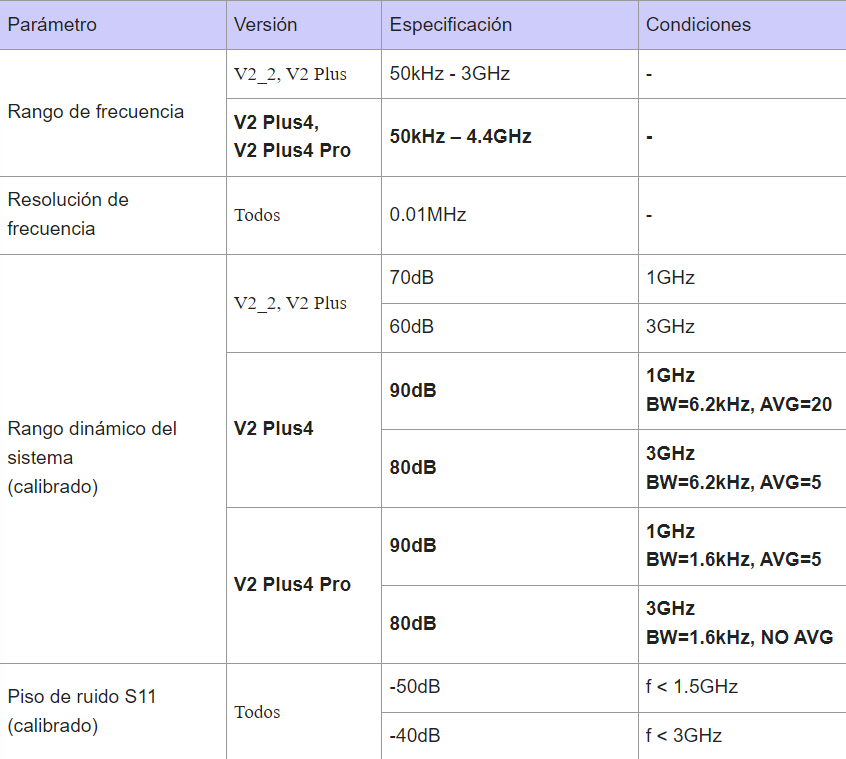
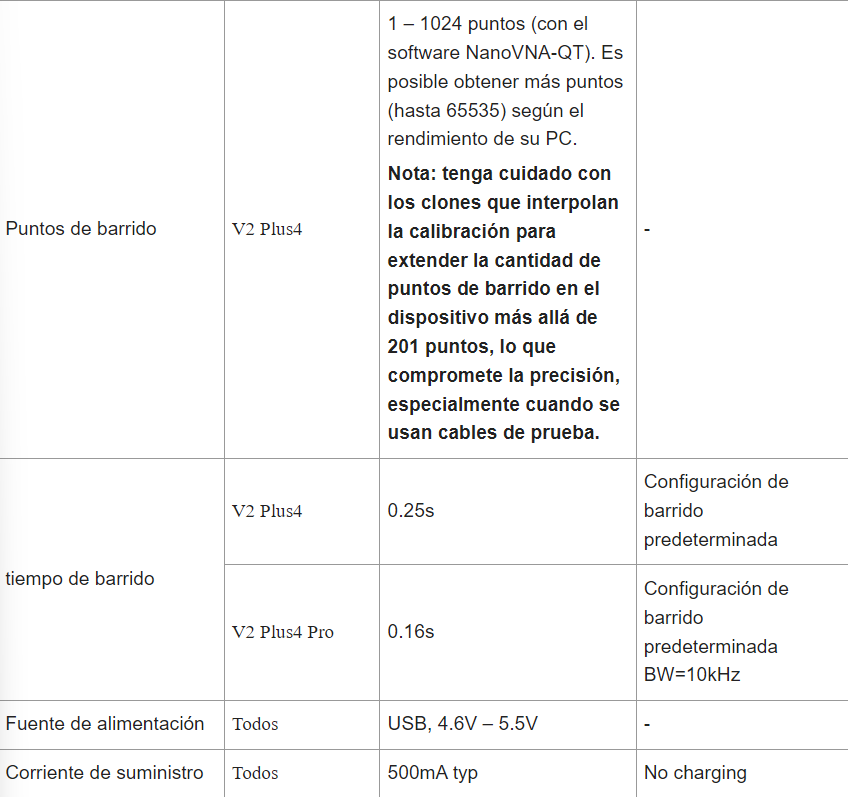
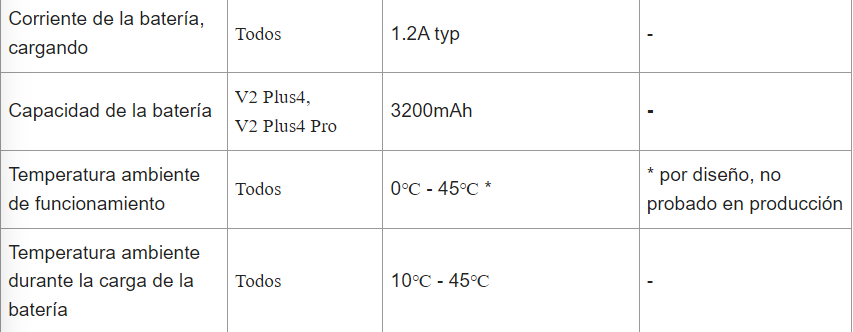





Por último dejo el [link](https://nanorfe.com/nanovna-v2-user-manual.html) del manual de usuario de este instrumento de medición

#### Mediciones en el dominio del tiempo

Este instrumento tambien puede realizar mediciones en el dominio del tiempo aunque no sea una medicion directa. Para esto debemos activar en el display la opción de transformación. En este punto automaticamente todos los datos en el display pasaran al dominio del tiempo y se mostrará la relación entre frecuencia y tiempo.

- Al incrementar la frecuencia de trabajo, se aumenta la resolición temporal.

Al fijar una frecuencia minima de trabajo estamos fijando que tan grande sera el tiempo máximo, dado que estas magnitudes son inversamente proporcionales.

En la siguiente imágen podemos ver la respuesta al impulso de un filtro pasabanda en función del tiempo.

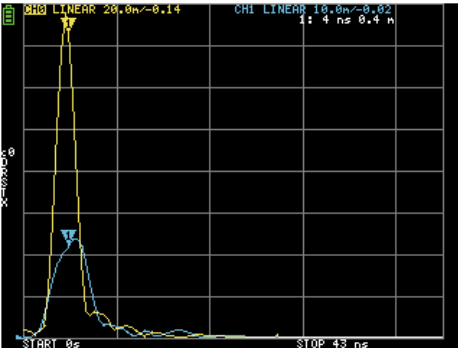

#### Comparación con DSO GW Insteak

Al ver la hoja de datos se encuentran distintos anchos de banda dependiendo el modelo. En la imágen debajo de este texto se encuentra una tabla de la hoja de datos donde indica que su Bandwidth o ancho de banda esta dentro del rango: $70MHz - 150MHz$ dependiendo del modelo.

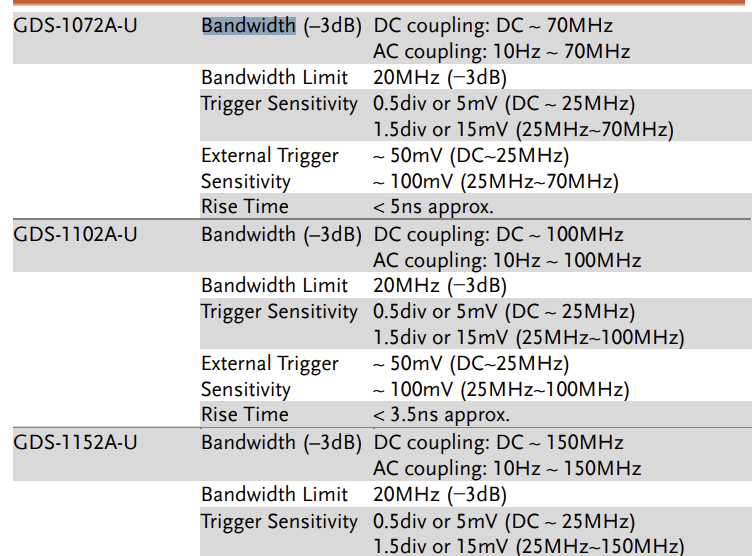

##### Impedancia de entrada

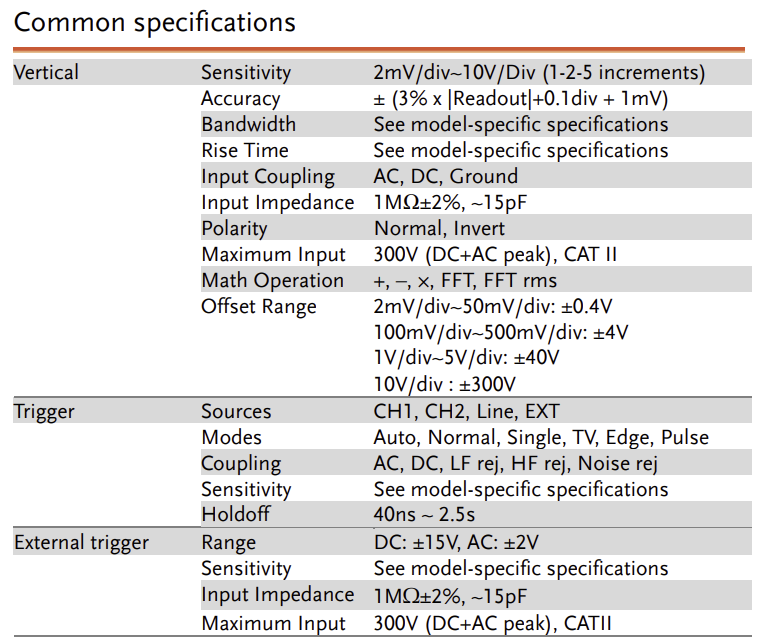

En esta tabla podemos ver que la impedancia de entrada tanto del canal vertical como para el trigger externo esta en el rango de los Mega. Ademas es importante recalcar que no es una componente resistiva pura sino que tambien posee una componente capacitiva.

##### Rango dinámico

Esta información parece no estar tan a la vista, pero al realizar una FFT con este instrumento vemos que la maxima escala en db por división es de 20dB, por lo que si asumimos 4 divisiones verticales que es lo que tienen generalmente estos dispositivos estariamos en el rango de los 80dB. De todas formas es una información que hay que chequear dado que no esta informado claramente en el manual del dispositivo.

##### Comparación

Para realizar una comparación de estos intrumentos primero hay que tener en cuenta cual será la utilidad del mismo. Dado que si queremos medir señales temporales que no tengan mucho que ver con parámetros "S" no deberíamos elegir el NANO VNA, dado que esta no es su función.
Alclarada esta condición, para realizar mediciones del tipo adaptación de impedancias o dispersión entre otras, es el perfecto caso para la utilización del NANO VNA. Sin embargo la versatilidad que posee el DSO, nos permite realizar muchas notras cosas como medir transitorios o incluso respuesta en frecuencia de algunos sistemas, a pesar de que esta última tiene mucha incertidumbre. El DSO nos permite conocer como es la forma de la señal o las caracteristicas de la señal, este no es un instrumento de medición, por esta razon vemos que en su manual, en donde se detalla la incertidumbre veremos cifras cercanas al 2%, algo que metrologicamente no es muy aceptable dado que es la primer fuente de incertidumbre en una cadena de medición, pero nos ayuda a ver a grandes rasgos la forma y tipo de señal con la que trabajaremos para luego uilizar el NANO VNA para realizar una medición más seria.